In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime

In [2]:
import tensorflow as tf
from tensorflow.contrib.layers import fully_connected,dropout,l2_regularizer

In [3]:
x = tf.placeholder('float', [None, 4096])
y = tf.placeholder('float')
hl = tf.placeholder('float') #hinge_loss

In [4]:
def get_video_list(path):
    videos=[]
    with open(path, 'r') as f:
        for line in f:
            videos.append(line.strip())
    return videos

In [5]:
def get_training_set(path):

    abnormal_path =path

    normal_path = path

    batchsize=60
    batch_Ab_size = 30

    num_abnormal = 170

    num_normal =160

    abnorm_list = np.random.permutation(num_abnormal)
    abnorm_list=abnorm_list[:batch_Ab_size]

    norm_list = np.random.permutation(num_normal)
    norm_list = norm_list[:batch_Ab_size]
    
    #print("Loading abnornmal Features...")
    videos = get_video_list(abnormal_path+"/anomaly.txt")
    
    abNormal_features ={}

    for i in abnorm_list:
        vid_path=os.path.join(abnormal_path,videos[i] )
        with open(vid_path,'r') as f:
            lines = f.read().splitlines()
            key=os.path.basename(videos[i])
            key=os.path.splitext(key)[0]
            #print(key)
            abNormal_features[key]=[]
        for line in lines:
            abNormal_features[key].append(np.float32(line.split()))
        abNormal_features[key]=np.array(abNormal_features[key])

    #abNormal_features=np.array(abNormal_features)    
    
    #print("Abnoraml features videos loded suceesfully.")
    
    #print("Loading normal Features...")
    
    videos = get_video_list(abnormal_path+"/normal.txt")
    normal_features={}

    for i in norm_list:
        vid_path=os.path.join(normal_path,videos[i] )
        if (os.path.isfile(vid_path) ):
            with open(vid_path,'r') as f:
                lines = f.read().splitlines()
                key=os.path.basename(videos[i])
                key=os.path.splitext(key)[0]
                normal_features[key]=[]
            for line in lines:
                  normal_features[key].append(np.float32(line.split()))
            
            normal_features[key]=np.array(normal_features[key])

    #normal_features=np.array(normal_features)
    
    #print("Normal Features Loaded successfully")
    return abNormal_features, normal_features

In [6]:
def get_features_specific_video(key,path,is_abnormal=True):
    
    if is_abnormal:
        videos = get_video_list(path+"/anomaly.txt")
    else:
        videos = get_video_list(path+"/normal.txt")
        
    for video in videos:
        
        if key in video:
            vid_path=os.path.join(path,videos[i] )
            with open(vid_path,'r') as f:
                lines = f.read().splitlines()
            features=[]
            for line in lines:
                features.append(np.float32(line.split()))
            return np.array(features)

In [7]:
Anomaly,Normal=get_training_set("./out")#RoadAccidents028_x264

In [8]:
n_hidden1 = 512
n_hidden2 = 32
n_output = 1
batch_size = 32

In [9]:
def dnn_network(X):
    tf_h1 = {'weights':tf.Variable(tf.random_normal([4096, n_hidden1])), #4096 feature vector
                      'biases':tf.Variable(tf.random_normal([n_hidden1]))}

    tf_h2 = {'weights':tf.Variable(tf.random_normal([n_hidden1, n_hidden2])),
                      'biases':tf.Variable(tf.random_normal([n_hidden2]))}

    tf_op = {'weights':tf.Variable(tf.random_normal([n_hidden2, n_output])),
                    'biases':tf.Variable(tf.random_normal([n_output])),}


    l1 = tf.add(tf.matmul(X,tf_h1['weights']), tf_h1['biases'])
    l1 = tf.nn.relu(l1)
    l1 = tf.layers.dropout(l1, 0.6)
    
    
    l2 = tf.add(tf.matmul(l1,tf_h2['weights']), tf_h2['biases'])
    l2  = tf.layers.dropout(l2, 0.6)
    
    
    output = tf.matmul(l2,tf_op['weights']) + tf_op['biases']
    output = tf.nn.sigmoid(output)
    

    return output , tf_h1['weights'] , tf_h2['weights'] , tf_op['weights']


In [10]:
output , weights_1 , weights_2, weights_3 = dnn_network(x)
cost = 0.001 * (tf.nn.l2_loss(weights_1) + tf.nn.l2_loss(weights_2) + tf.nn.l2_loss(weights_3)) + hl
optimizer = tf.train.AdagradOptimizer(0.001).minimize(cost)


In [11]:
# Initialize and run
init = tf.global_variables_initializer()
sess = tf.Session()
sess.run(init)

In [12]:
saver = tf.train.Saver()  # to save model

In [13]:
saver.restore(sess, './model_logs/501/501/model-501')

INFO:tensorflow:Restoring parameters from ./model_logs/501/501/model-501


In [14]:
def check_video_contains_anomaly(video):
    prediction_a=sess.run(output,feed_dict={x: video})
    prediction_a=prediction_a.flatten()
     # if anomaly score is greater then 0.4 then consider as anomaly 
    index = np.where(prediction_a>0.4)[0]
    pred=0
    if prediction_a.max() > 0.4:
        pred=1
    return pred,index
    

## this section generates data for further classification of video in to (fighting/accident)

In [15]:
abnormal_path="./out"
a_t_vid = get_video_list("./out"+"/anomaly.txt")


In [16]:
# for fighting video class will be 1
# for roadaccidents vlass will be 0

class_vid=[]
prediction =[] # prediction only for anomaly detection
anomaly_frames=[]

#video_class
for i in range(len(a_t_vid)):
    
    vid_path=os.path.join(abnormal_path,a_t_vid[i] )
    
    with open(vid_path,'r') as f:
        lines = f.read().splitlines()
        key=os.path.basename(a_t_vid[i])
        key=os.path.splitext(key)[0]
        
        if "Fighting" in key: # this is for further classification using DNN
            class_vid.append(1)
        elif "Road" in key:
            class_vid.append(0)
            
        #abNormal_features[key]=[]
        features=[]
    
    for line in lines:
        features.append(np.float32(line.split()))
    
    is_anomaly,a_loc=check_video_contains_anomaly(features)
    
    prediction.append(is_anomaly)
    anomaly_frames.append(a_loc)
    #abNormal_features[key]=
    #if is_anomaly>0:
    #    is_anomaly) 
        
    
    #abNormal_features[key]=np.array(abNormal_features[key])

In [17]:

import pickle

dup_set=open("Data_set.pkl","wb")
pickle.dump({"File_location":a_t_vid,
             "Anomaly_type":class_vid,
             "anomaly_frames":anomaly_frames},dup_set)

### Anomaly type menas (1:Fighting / 0: Accident) AnomalyFrame contains frame no where anomaly occured. 

### This Data Set is used for further anomaly type classification 

In [18]:
import pandas as pd
pd.DataFrame(zip(a_t_vid,class_vid,anomaly_frames),columns=['File_location', 'Anomaly_type', 'Anomaly_frame'])

,File_location,Anomaly_type,Anomaly_frame
0,Anomaly-Videos-Part-2/Fighting/Fighting002_x26...,1,[]
1,Anomaly-Videos-Part-2/Fighting/Fighting003_x26...,1,[]
2,Anomaly-Videos-Part-2/Fighting/Fighting004_x26...,1,[]
3,Anomaly-Videos-Part-2/Fighting/Fighting005_x26...,1,[]
4,Anomaly-Videos-Part-2/Fighting/Fighting006_x26...,1,[]
5,Anomaly-Videos-Part-2/Fighting/Fighting007_x26...,1,[]
6,Anomaly-Videos-Part-2/Fighting/Fighting008_x26...,1,"[28, 29, 30, 31]"
7,Anomaly-Videos-Part-2/Fighting/Fighting009_x26...,1,[]
8,Anomaly-Videos-Part-2/Fighting/Fighting010_x26...,1,[22]
9,Anomaly-Videos-Part-2/Fighting/Fighting011_x26...,1,[]


In [19]:
normal_path="./out"
n_t_vid = get_video_list("./out"+"/anomaly.txt")

In [29]:
pred_n=[]
for i in range(len(n_t_vid)):
    vid_path=os.path.join(abnormal_path,n_t_vid[i] )
    
    with open(vid_path,'r') as f:
        lines = f.read().splitlines()
    features=[]
    
    for line in lines:
        features.append(np.float32(line.split()))
        
    pred,_=check_video_contains_anomaly(features)
    
    pred_n.append(pred)
    

In [30]:
tp=np.array([1]*176)
tn=np.array([0]*176)

In [31]:
actual=np.hstack((tp,tn))

In [38]:
final_pred=np.hstack((np.array(prediction),np.array(pred_n)))

In [39]:
import sklearn.metrics as metrics
fpr, tpr, threshold = metrics.roc_curve(actual, final_pred)
roc_auc = metrics.auc(fpr, tpr)

In [41]:
metrics.confusion_matrix(actual,final_pred)

array([[ 98,  78],
       [ 76, 100]])

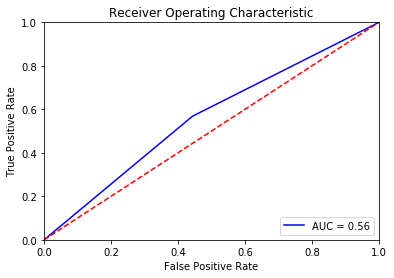

In [40]:
plt.title('Receiver Operating Characteristic')
plt.plot(fpr, tpr, 'b', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

## Video Visualization

In [171]:
from video_utils import *
import matplotlib.image as mpimg

In [133]:
import glob
def create_video(Image_source,output_video):
    img_array = []
    for filename in glob.glob(Image_source+'/*.jpg'):
        img = cv2.imread(filename)
        height, width, layers = img.shape
        size = (width,height)
        img_array.append(img)
    
    out = cv2.VideoWriter(output_video,cv2.VideoWriter_fourcc(*'DIVX'), 10, size)
    
    for i in range(len(img_array)):
        out.write(img_array[i])
    
    out.release()

In [164]:
def capture_anomoulus_video_segment(video_path,video_key):
    max_processing_sec = 599
    sample_every_N_sec = 1
    frame_inc=16
    num_frames_per_clip = 16
    start_frame = 1
    
   # print(video_key)
    fc,fr=get_frame_count(video_path)
    
    end_frame = min(fc, int(max_processing_sec * fr)) -num_frames_per_clip
    
    #video_feature =get_features_specific_video(video_key,"./out",)
    pred_a=sess.run(output,feed_dict={x: Anomaly[video_key]})
    
    #print(pred_a)
    
    start_frames=list(range(start_frame, end_frame, frame_inc))
    
    frame_bin=np.round(np.linspace(1, len(start_frames), num=33))
    
    pred_a=pred_a.flatten()
    fb_pre=np.where(pred_a>0.4)[0]
    
    video_segments=[]
    i=0
    #for i in range(len(fb_pre)-1):
    #loop to capture anomalous start and end segment
    while(i<len(fb_pre)-1):
        s_seg=frame_bin[fb_pre[i]]*16
        if (fb_pre[i+1] -fb_pre[i] ==1): #diffrenciation 
            while(i<len(fb_pre)-1 and fb_pre[i+1]-fb_pre[i]==1):
                i +=1
            #i+=1
            e_seg=frame_bin[fb_pre[i]]*16+16
        else:
            i += 1
            e_seg=s_seg+16
        video_segments.append([s_seg,e_seg])
        
#     p=np.zeros(end_frame)
#     for i,time in enumerate(video_segments):
#         p[int(time[0]):int(time[1])]=pred_a[fb_pre[i]]
    v_map=frame_bin[fb_pre]*16
    return video_segments,v_map,pred_a #,p

In [165]:
def clip_anoloums_video_from_segment(video_to_extract,video_key,output_vid_dir):
    vf,gf,pred_a=capture_anomoulus_video_segment(video_to_extract,video_key)
    
    #path to store Video segment
    path = os.path.join(output_vid_dir,video_key)
    os.makedirs(path, exist_ok=True)
    
    for start, end in vf:
        n_frames = int(end-start)
        extract_frames(video_to_extract,start,path,n_frames)
     
    output_video=os.path.join(path,video_key)
    #print(output_video)
    create_video(path,output_video+".avi")
    
    return gf,pred_a


## generating video for RoadAccident 

## This solution also includes video and images where exact anomaly happened 

In [218]:
video_to_extract="../Anomaly-Videos-Part-1/Anomaly-Videos-Part-3/RoadAccidents/RoadAccidents095_x264.mp4"
frame_nos,pred_a=clip_anoloums_video_from_segment(video_to_extract,"RoadAccidents095_x264","./test5")

width = 320.0
height = 240.0


Text(0.5, 0, 'Prediction in 32 embedded frames')

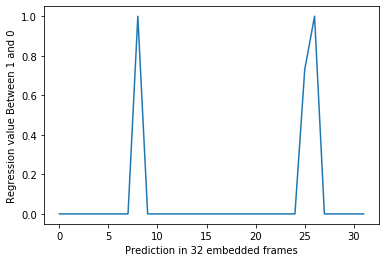

In [219]:
plt.plot(pred_a)
plt.ylabel('Regression value Between 1 and 0')
plt.xlabel('Prediction in 32 embedded frames')

### The plot above shows anomaly in video so what are the frames where anomaly occured

In [220]:
frame_nos

array([288., 896., 928.])

### The plot below shows exact frames where anomaly occured

/home/ganesh/anaconda3/envs/env_3_6/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


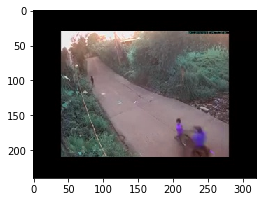

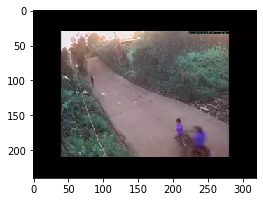

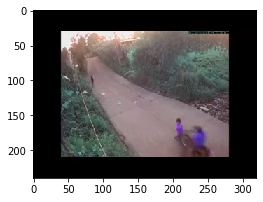

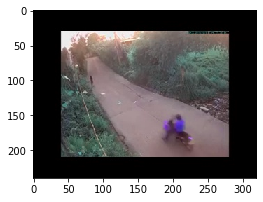

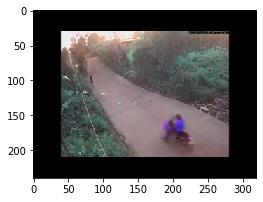

...

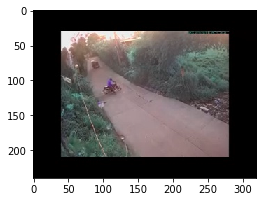

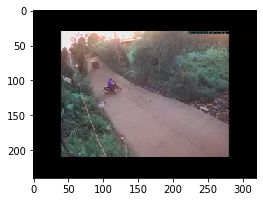

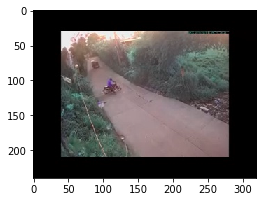

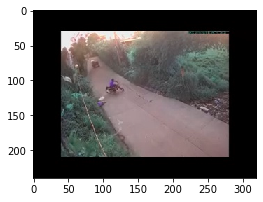

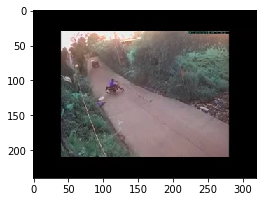

In [184]:
imgs=glob.glob("./test5/RoadAccidents095_x264/"+'/*.jpg')
#mpimg.imread('MyImage.png')
imgs.sort()
# from IPython.display import Image
# Image(filename=imgs[0])
# Image(filename=imgs[1])
for img in imgs:
    plt.figure(figsize=(4,4))
    plt.imshow(cv2.imread(img))

# generating video for fight

In [221]:
video_to_extract="../Anomaly-Videos-Part-1/Anomaly-Videos-Part-2/Fighting/Fighting032_x264.mp4"
frame_nos,pred_a=clip_anoloums_video_from_segment(video_to_extract,"Fighting032_x264","./test5")

width = 320.0
height = 240.0


Text(0.5, 0, 'Prediction in 32 embedded frames')

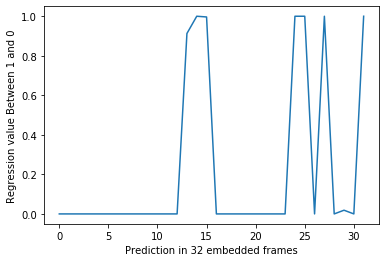

In [222]:
plt.plot(pred_a)
plt.ylabel('Regression value Between 1 and 0')
plt.xlabel('Prediction in 32 embedded frames')

### This video has anomaly at multiple places like initialy fighting starts then after some garbage discussion and again fight so model predicts this temporal anomalies 

/home/ganesh/anaconda3/envs/env_3_6/lib/python3.6/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


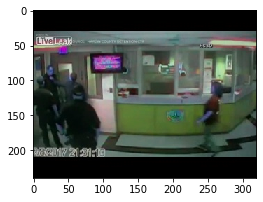

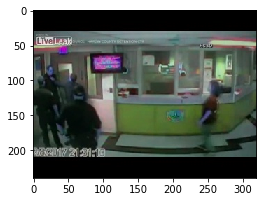

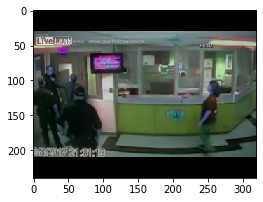

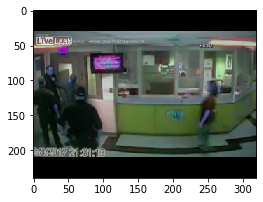

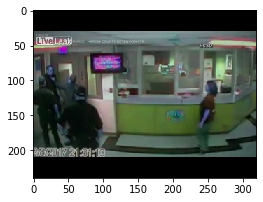

...

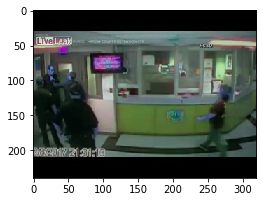

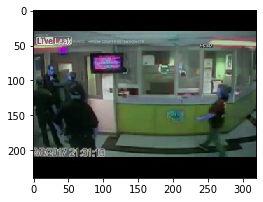

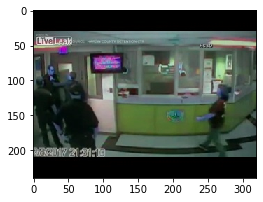

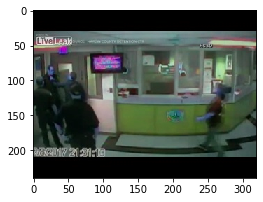

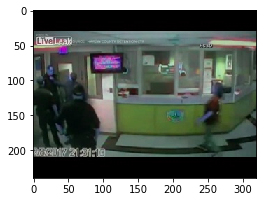

In [188]:
imgs=glob.glob("./test5/Fighting032_x264/"+'/*.jpg')
#mpimg.imread('MyImage.png')
imgs.sort()
# from IPython.display import Image
# Image(filename=imgs[0])
# Image(filename=imgs[1])
for img in imgs:
    plt.figure(figsize=(4,4))
    plt.imshow(cv2.imread(img))

## Normal Videos are predicted as 0 

In [215]:
pred_a=sess.run(output,feed_dict={x: Normal['Normal_Videos135_x264']})

Text(0.5, 0, 'Prediction in 32 embedded frames')

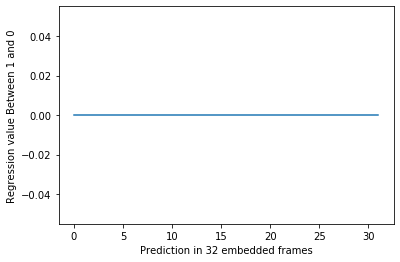

In [217]:
plt.plot(pred_a)
plt.ylabel('Regression value Between 1 and 0')
plt.xlabel('Prediction in 32 embedded frames')